# Анализ и прогнозирование временных рядов методами искусственного интеллекта

## **Практическая работа 4. Матричный профиль. Поиск примитивов на его основе.**

Смените рабочую директорию с помощью команды `chdir()`. Для этого передайте этой команде свой путь до каталога, в котором содержатся материалы четвертой практической работы. После выполнения этой команды все последующие операции с файлами и каталогами будут производиться относительно указанного каталога.

In [1]:
import os

practice_dir_path = 'C:/Users/Hotaru/04 Matrix profile'
os.chdir(practice_dir_path)

Выполните команды, которые автоматически перезагружают все импортированные модули при их изменении.

In [2]:
%load_ext autoreload
%autoreload 2

Импортируйте библиотеки и модули, необходимые для реализации практической работы 4.

In [3]:
!pip install stumpy

In [4]:
import pandas as pd
import numpy as np
import os
import datetime

from modules.plots import *
from modules.mp import compute_mp
from modules.motifs import top_k_motifs
from modules.discords import top_k_discords
from modules.meter_swapping_detection import *

## **Часть 1.** Матричный профиль. Поиск мотивов и диссонансов.

### **Задача 1.**
Загрузите временной ряд, который содержит данные о почасовом потреблении электроэнергии некоторого итальянского города, снимаемые в течение 3 лет, начиная с 1 января 1995 года.

In [5]:
ts_url = './datasets/part1/italianpowerdemand.csv'

ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

In [6]:
ts_url = './datasets/part1/italianpowerdemand.csv'

# Load the time series
ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

# Check the data
print("Shape of the time series:", ts.shape)
print("First few values of the time series:", ts[:5])


Shape of the time series: (29931,)
First few values of the time series: [127. 126. 120. 112. 110.]


Визуализируйте временной ряд, используя функцию `plot_ts()` из модуля *plot.py*.

In [7]:
plot_ts(ts, "Input time series")

Анализ временных рядов на основе матричного профиля осуществляет библиотека [stumpy](https://stumpy.readthedocs.io/en/latest/index.html). Напишите функцию `compute_mp()` в модуле *mp.py*, которая вычисляет матричный профиль временного ряда на основе выбранной вами функции из библиотеки *stumpy*.

Shape of the time series: (29931,)
First few values of the time series: [127. 126. 120. 112. 110.]
Matrix Profile (first 10 values): [2.6090936641687352 2.5924180135439157 2.59877638124769 2.607746108269811
 2.6172980739425853 2.641673821546883 2.6338616715926384
 2.6263365982979443 2.6207360034223237 2.613679331730088]
Matrix Profile Indices (first 10 values): [8761 8762 8763 8764 8765 8766 8767 8768 8769 8770]
Subsequence length (m): 165
Exclusion Zone: 83


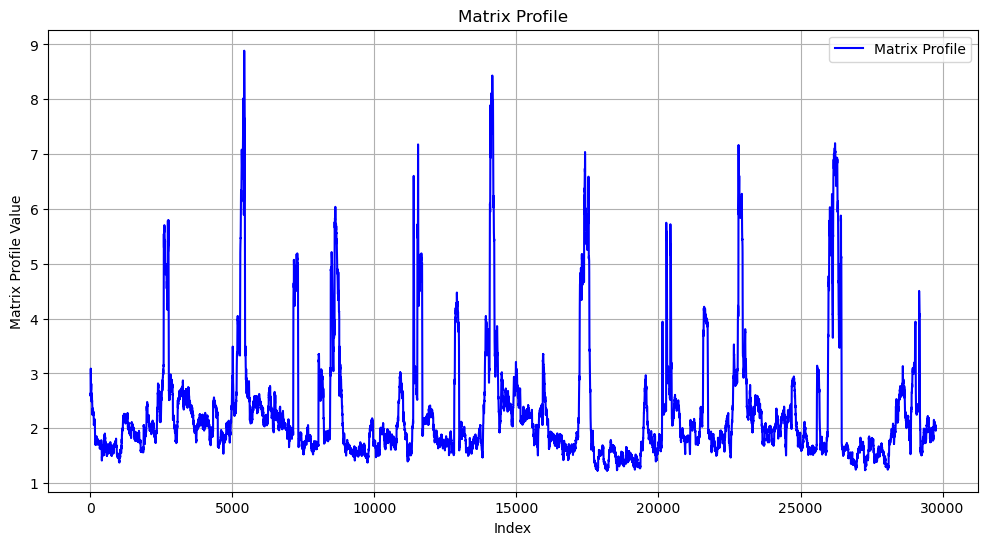

In [12]:
import numpy as np
import pandas as pd
import stumpy
import matplotlib.pyplot as plt

def compute_mp(ts1: np.ndarray, m: int, exclusion_zone: int = None, ts2: np.ndarray = None):
    """
    Compute the matrix profile

    Parameters
    ----------
    ts1: the first time series
    m: the subsequence length
    exclusion_zone: exclusion zone (optional)
    ts2: the second time series (optional, defaults to None)

    Returns
    -------
    output: the matrix profile structure
            (matrix profile, matrix profile index, subsequence length, exclusion zone, the first and second time series)
    """
    if ts2 is None:
        ts2 = ts1
    
    if exclusion_zone is None:
        exclusion_zone = int(np.ceil(m / 4))

    matrix_profile = stumpy.stump(ts1, m, ts2)

    return {
        'mp': matrix_profile[:, 0],  # Matrix profile values
        'mpi': matrix_profile[:, 1],  # Indices of nearest neighbors
        'm': m,  # Subsequence length
        'excl_zone': exclusion_zone,  # Exclusion zone
        'data': {'ts1': ts1, 'ts2': ts2}  # The first and second time series
    }

# Load the time series
ts_url = './datasets/part1/italianpowerdemand.csv'
ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

# Check the data
print("Shape of the time series:", ts.shape)
print("First few values of the time series:", ts[:5])

# Parameters for matrix profile calculation
m = 165
excl_zone = int(np.ceil(m / 2))

# Calculate the matrix profile
mp = compute_mp(ts, m, excl_zone)

# Print the computed matrix profile information
print("Matrix Profile (first 10 values):", mp['mp'][:10])
print("Matrix Profile Indices (first 10 values):", mp['mpi'][:10])
print("Subsequence length (m):", mp['m'])
print("Exclusion Zone:", mp['excl_zone'])

# Optionally, plot the matrix profile
plt.figure(figsize=(12, 6))
plt.plot(mp['mp'], label='Matrix Profile', color='blue')
plt.title('Matrix Profile')
plt.xlabel('Index')
plt.ylabel('Matrix Profile Value')
plt.legend()
plt.grid()
plt.show()


### **Задача 2.**
Выполните поиск top-$k$ мотивов в исходном временном ряде на основе построенного матричного профиля. Для этого реализуйте самостоятельно функцию `top_k_motifs()` в модуле *motifs.py*. Среди найденных мотивов не должно быть тривиальных совпадений, поэтому в `top_k_motifs()` добавьте вызов функции `apply_exclusion_zone()` из модуля *utils.py*.

In [47]:
top_k = 6
motifs = {}

# INSERT YOUR CODE

In [16]:
import numpy as np
from modules.utils import apply_exclusion_zone

def apply_exclusion_zone(idx: int, motif_indices: list, exclusion_zone: int) -> bool:
    for motif_idx in motif_indices:
        if abs(motif_idx - idx) <= exclusion_zone:
            return True
    return False

def top_k_motifs(matrix_profile: dict, top_k: int = 6, exclusion_zone: int = 0) -> dict:
    """
    Find top k motifs in the time series based on the matrix profile.

    Parameters
    ----------
    matrix_profile: dict
        The output from the compute_mp function, should contain 'mp' and 'mpi'.
    top_k: int
        The number of top motifs to find.
    exclusion_zone: int
        The size of the exclusion zone to avoid trivial matches.

    Returns
    -------
    dict: Dictionary containing indices and distances of the top k motifs.
    """
    motifs_idx = []  # List to hold indices of selected motifs
    motifs_dist = []  # List to hold distances of selected motifs

    # Extract distances from the matrix profile
    distances = matrix_profile['mp']  # Using the matrix profile values
    print("Distances:", distances)  # Debugging output

    # Get indices sorted by distance
    sorted_indices = np.argsort(distances)

    for idx in sorted_indices:
        if len(motifs_idx) >= top_k:
            break
        
        # Check if the current index should be excluded
        is_excluded = apply_exclusion_zone(idx, motifs_idx, exclusion_zone)
        print("Checking index:", idx, "Excluded:", is_excluded)  # Debugging output
        
        if not is_excluded and distances[idx] != 0:  # Avoid trivial matches (distance == 0)
            motifs_idx.append(idx)
            motifs_dist.append(distances[idx])

    print("Motifs Indices:", motifs_idx)
    print("Motifs Distances:", motifs_dist)

    return {
        "indices": motifs_idx,
        "distances": motifs_dist
    }

# Example usage
# Assuming you have completed the matrix profile computation earlier in your code:
top_k = 6
motifs = top_k_motifs(mp, top_k=top_k, exclusion_zone=mp['excl_zone'])


Distances: [2.6090936641687352 2.5924180135439157 2.59877638124769 ...
 2.007681867612602 2.020641558173467 2.030675731613809]
Checking index: 18188 Excluded: False
Checking index: 17852 Excluded: False
Checking index: 18189 Excluded: True
Checking index: 17853 Excluded: True
Checking index: 18194 Excluded: True
Checking index: 17858 Excluded: True
Checking index: 18195 Excluded: True
Checking index: 17859 Excluded: True
Checking index: 27276 Excluded: False
Checking index: 18539 Excluded: False
Checking index: 17857 Excluded: True
Checking index: 18193 Excluded: True
Checking index: 18202 Excluded: True
Checking index: 17866 Excluded: True
Checking index: 18196 Excluded: True
Checking index: 17860 Excluded: True
Checking index: 18544 Excluded: True
Checking index: 27281 Excluded: True
Checking index: 18540 Excluded: True
Checking index: 27277 Excluded: True
Checking index: 18201 Excluded: True
Checking index: 17865 Excluded: True
Checking index: 18543 Excluded: True
Checking index: 27

Выполните визуализацию найденных top-$k$ мотивов с помощью функции `plot_motifs()` из *plots.py*.

In [33]:
def plot_motifs(mp: dict, top_k_motifs: dict) -> None:
    """
    Plot the top-k motifs in time series and matrix profile.

    Parameters
    ----------
    mp: the matrix profile structure
    top_k_motifs: top-k motifs
    """
    
    top_k = len(top_k_motifs['indices'])
    n = len(mp['data']['ts1'])
    m = mp['m']

    num_cols = 2
    num_rows = 2 + math.ceil(top_k / num_cols)

    titles = ['Time Series with top-k motifs', 'Matrix Profile'] + [f"Top-{i+1} motifs" for i in range(top_k)]

    fig = make_subplots(rows=num_rows, cols=num_cols,
                        specs=[[{"colspan": 2}, None]] * 2 + [[{}, {}]] * (num_rows - 2),
                        shared_xaxes=False,
                        vertical_spacing=0.1,
                        subplot_titles=titles)

    # Plot the time series
    fig.add_trace(go.Scatter(x=np.arange(n), y=mp['data']['ts1'], line=dict(color='grey'), name="Time Series"), row=1, col=1)

    # Plot the motifs
    for i in range(top_k):
        left_motif_idx = top_k_motifs['indices'][i][0]
        right_motif_idx = top_k_motifs['indices'][i][1]
        x = np.arange(left_motif_idx, right_motif_idx + m)
        num_values_between_motif = right_motif_idx - (left_motif_idx + m)
        y = np.concatenate((mp['data']['ts1'][left_motif_idx:left_motif_idx + m], 
                            np.full([1, num_values_between_motif], np.nan)[0], 
                            mp['data']['ts1'][right_motif_idx:right_motif_idx + m]))
        color_i = i % len(px.colors.qualitative.Plotly)
        fig.add_trace(go.Scatter(x=x, y=y, name=f"Top-{i+1} motifs", line=dict(color=px.colors.qualitative.Plotly[color_i])), row=1, col=1)

    # Plot the matrix profile
    fig.add_trace(go.Scatter(x=np.arange(n), y=mp['mp'], line=dict(color='grey', width=2), name="Matrix Profile"), row=2, col=1)

    # Highlight motifs in the matrix profile
    for i in range(top_k):
        motifs_mp = [mp['mp'][motif_idx] for motif_idx in top_k_motifs['indices'][i]]
        motifs_idx = list(top_k_motifs['indices'][i])
        color_i = i % len(px.colors.qualitative.Plotly)
        fig.add_trace(go.Scatter(x=motifs_idx, y=motifs_mp, mode='markers', 
                                  marker=dict(symbol='star', color=px.colors.qualitative.Plotly[color_i], size=15), 
                                  name=f"Top-{i+1} motifs"), row=2, col=1)

    # Plot each motif in separate subplots
    for i in range(top_k):
        col = int(i % num_cols) + 1
        row = 2 + int(i / num_cols) + 1
        left_motif_idx = top_k_motifs['indices'][i][0]
        right_motif_idx = top_k_motifs['indices'][i][1]
        color_i = i % len(px.colors.qualitative.Plotly)
        fig.add_trace(go.Scatter(x=np.arange(m), y=mp['data']['ts1'][left_motif_idx:left_motif_idx + m], line=dict(color=px.colors.qualitative.Plotly[color_i]), showlegend=False), row=row, col=col)
        fig.add_trace(go.Scatter(x=np.arange(m), y=mp['data']['ts1'][right_motif_idx:right_motif_idx + m], line=dict(color=px.colors.qualitative.Plotly[color_i]), showlegend=False), row=row, col=col)

    fig.update_annotations(font=dict(size=22, color='black'))

    # Update axis properties
    fig.update_xaxes(showgrid=False,
                     title_font=dict(size=22, color='black'),
                     linecolor='#000',
                     ticks='outside',
                     tickfont=dict(size=18, color='black'),
                     linewidth=2,
                     tickwidth=2)
    fig.update_yaxes(showgrid=False,
                     title_font=dict(size=22, color='black'),
                     linecolor='#000',
                     ticks='outside',
                     tickfont=dict(size=18, color='black'),
                     zeroline=False,
                     linewidth=2,
                     tickwidth=2)

    fig.update_layout(title_font=dict(size=24, color='black'),
                      plot_bgcolor='rgba(0,0,0,0)',
                      paper_bgcolor='rgba(0,0,0,0)', 
                      height=1300)

    fig.show()


In [34]:
def top_k_motifs(matrix_profile: dict, top_k: int = 6, exclusion_zone: int = 0) -> dict:
    """
    Find top k motifs in the time series based on the matrix profile.

    Parameters
    ----------
    matrix_profile: dict
        The output from the compute_mp function, should contain 'mp' and 'mpi'.
    top_k: int
        The number of top motifs to find.
    exclusion_zone: int
        The size of the exclusion zone to avoid trivial matches.

    Returns
    -------
    dict: Dictionary containing indices and distances of the top k motifs.
    """
    motifs_idx = []  # List to hold indices of selected motifs
    motifs_dist = []  # List to hold distances of selected motifs

    # Extract distances from the matrix profile
    distances = matrix_profile['mp']  # Using the matrix profile values
    print("Distances:", distances)  # Debugging output

    # Get indices sorted by distance
    sorted_indices = np.argsort(distances)

    for idx in sorted_indices:
        if len(motifs_idx) >= top_k:
            break
        
        # Check if the current index should be excluded
        is_excluded = apply_exclusion_zone(idx, motifs_idx, exclusion_zone)
        print("Checking index:", idx, "Excluded:", is_excluded)  # Debugging output
        
        if not is_excluded and distances[idx] != 0:  # Avoid trivial matches (distance == 0)
            motifs_idx.append(idx)
            motifs_dist.append(distances[idx])

    print("Motifs Indices:", motifs_idx)
    print("Motifs Distances:", motifs_dist)

    # If you want to return pairs of motifs for each found motif, you need to adjust here.
    # Below is an example of how to create pairs - adjust it based on your logic needs.
    motifs_pairs = [[idx, matrix_profile['mpi'][idx]] for idx in motifs_idx if matrix_profile['mpi'][idx] not in motifs_idx][:top_k]

    return {
        "indices": motifs_pairs,
        "distances": motifs_dist
    }


In [36]:
# Load the time series
ts_url = './datasets/part1/italianpowerdemand.csv'
ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

# Set parameters for matrix profile calculation
m = 165
excl_zone = int(np.ceil(m / 2))

# Calculate the matrix profile
mp = compute_mp(ts, m, excl_zone)

# Find top-k motifs
top_k = 6
motifs = top_k_motifs(mp, top_k=top_k, exclusion_zone=mp['excl_zone'])

# Visualize the top-k motifs
plot_motifs(mp, motifs)

Distances: [2.6090936641687352 2.5924180135439157 2.59877638124769 ...
 2.007681867612602 2.020641558173467 2.030675731613809]
Checking index: 18188 Excluded: False
Checking index: 17852 Excluded: False
Checking index: 18189 Excluded: True
Checking index: 17853 Excluded: True
Checking index: 18194 Excluded: True
Checking index: 17858 Excluded: True
Checking index: 18195 Excluded: True
Checking index: 17859 Excluded: True
Checking index: 27276 Excluded: False
Checking index: 18539 Excluded: False
Checking index: 17857 Excluded: True
Checking index: 18193 Excluded: True
Checking index: 18202 Excluded: True
Checking index: 17866 Excluded: True
Checking index: 18196 Excluded: True
Checking index: 17860 Excluded: True
Checking index: 18544 Excluded: True
Checking index: 27281 Excluded: True
Checking index: 18540 Excluded: True
Checking index: 27277 Excluded: True
Checking index: 18201 Excluded: True
Checking index: 17865 Excluded: True
Checking index: 18543 Excluded: True
Checking index: 27

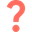
Проанализируйте и изложите содержательный смысл полученных результатов.

*# WRITE YOUR ANSWER*

### **Задача 3.**
Реализуйте самостоятельно функцию `top_k_discords()` в модуле *discords.py*, предназначенную для поиска top-$k$ диссонансов во временном ряде на основе матричного профиля. Чтобы исключить попадание тривиальных совпадений в результирующее множество диссонансов воспользуйтесь функцией `apply_exclusion_zone()` из модуля *utils.py*.

Загрузите временной ряд *nyc_taxi.csv* из директории *./datasets/part1/*, содежащий данные о среднем числе пассажиров NY такси за осень 2014 года.

In [37]:
ts_url = './datasets/part1/nyc_taxi.csv'

ts = pd.read_csv(ts_url, index_col=0, header=0).squeeze().to_numpy()
plot_ts(ts, "Input time series")

Выполните визуализацию найденных top-$k$ диссонансов.

In [43]:
import numpy as np
import pandas as pd
import stumpy
import math
from modules.utils import apply_exclusion_zone
from modules.plots import plot_discords  # Ensure this imports correctly

def compute_mp(ts1: np.ndarray, m: int, exclusion_zone: int = None, ts2: np.ndarray = None):
    if ts2 is None:
        ts2 = ts1

    if exclusion_zone is None:
        exclusion_zone = int(np.ceil(m / 4))

    # Calculate the matrix profile using stumpy
    matrix_profile = stumpy.stump(ts1, m, ts2)

    return {
        'mp': matrix_profile[:, 0],  # Matrix profile values
        'mpi': matrix_profile[:, 1],  # Indices of nearest neighbors
        'm': m,  # Subsequence length
        'excl_zone': exclusion_zone,  # Exclusion zone
        'data': {'ts1': ts1}  # First time series
    }

# Load the time series
ts_url = './datasets/part1/italianpowerdemand.csv'
ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

# Check the data
print("Shape of the time series:", ts.shape)
print("First few values of the time series:", ts[:5])

# Parameters for matrix profile
m = 96
excl_zone = int(np.ceil(m / 2))

# Compute the matrix profile
mp = compute_mp(ts, m, excl_zone)
print("Matrix Profile Output:", mp)  # Debugging line

# Finding top-k discords
def top_k_discords(matrix_profile: dict, top_k: int = 15) -> dict:
    discord_indices = []
    discord_distances = []

    # The matrix profile contains the distances for each subsequence
    distances = matrix_profile['mp']  # Using the matrix profile values
    sorted_indices = np.argsort(distances)[::-1]  # Sort in descending order

    for idx in sorted_indices:
        if len(discord_indices) >= top_k:
            break
        
        if distances[idx] != 0:  # Avoid trivial matches
            if not apply_exclusion_zone(idx, discord_indices, excl_zone):
                discord_indices.append(idx)
                discord_distances.append(distances[idx])
    
    return {
        "indices": discord_indices,
        "distances": discord_distances
    }

# Define top_k
top_k = 15
discords = top_k_discords(mp, top_k=top_k)

# Visualize the top-k discords
plot_discords(mp, discords)


Shape of the time series: (29931,)
First few values of the time series: [127. 126. 120. 112. 110.]
Matrix Profile Output: {'mp': array([1.7218086019647867, 1.7236966738167923, 1.7442593842818268, ...,
       1.5561925051871146, 1.5634748670179692, 1.5477826968767003],
      dtype=object), 'mpi': array([8761, 8762, 8763, ..., 21264, 21265, 21266], dtype=object), 'm': 96, 'excl_zone': 48, 'data': {'ts1': array([127., 126., 120., ..., 143., 161., 151.])}}


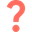
Проанализируйте и изложите содержательный смысл полученных результатов.

*# WRITE YOUR ANSWER*

## **Часть 2.** Сегментация повторяющихся активностей.

### **Задача 4.**

Загрузите временной ряд PAMAP *pamap.csv* из директории *./datasets/part2/*, представляющий собой показания закрепленного на человеке виброакселерометра. Данный ряд включает показания, снятые при выполнении человеком трех видов физической активности: ходьба, подъем по лестнице и спуск по лестнице. Необходимо сегментировать временной ряд на основе его матричного профиля для определения того, когда человек шел и когда поднимался/спускался. Поскольку подъем и спуск по лестнице – это схожие действия, поэтому будем считать, что это одна активность.  

In [44]:
ts_url = './datasets/part2/pamap.csv'

ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

Визуализируйте временной ряд PAMAP.

In [45]:
plot_ts(ts, "Input time series")

Найдите и визуализируйте матричный профиль временного ряда.

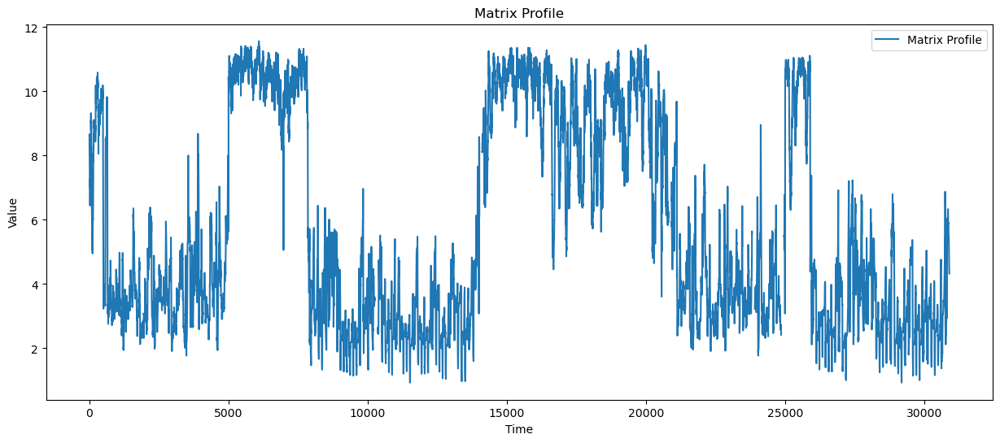

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import stumpy

# Загрузка данных
ts_url = './datasets/part2/pamap.csv'
ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

# Параметры
m = 100  # Размер окна

# Вычисление матричного профиля
mp = {}
mp['mp'] = stumpy.stump(ts, m=m)[:, 0]  # Только матричный профиль
mp['indices'] = stumpy.stump(ts, m=m)[:, 1]  # Индексы минимальных расстояний

# Визуализация матричного профиля
def plot_ts(ts, title):
    plt.figure(figsize=(15, 6))
    plt.plot(ts, label=title)
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Визуализация матричного профиля
plot_ts(mp['mp'], "Matrix Profile")


Вычислите порог по формуле, которая представлена в презентации [04 Matrix profile.pdf](https://github.com/mzym/TimeSeriesCourse/blob/main/slides/04%20Matrix%20profile.pdf).

In [54]:
# Удаление NaN из временного ряда, если такие есть
ts = ts[~np.isnan(ts)]

# Пересчитать матричный профиль после очистки данных
mp['mp'] = stumpy.stump(ts, m=m)[:, 0]
mp['indices'] = stumpy.stump(ts, m=m)[:, 1]


In [55]:
mean_mp = np.mean(mp['mp'])
std_mp = np.std(mp['mp'])

# Выберите коэффициент k (можно настроить)
k = 2  # Например, 2 стандартных отклонения

# Вычисление порога
threshold = mean_mp + k * std_mp

print(f"Calculated threshold: {threshold}")


Calculated threshold: 12.125186448208265


Выполните визуализацию результатов сегментации повторяющихся активностей.

C:\Users\Hotaru\anaconda3\envs\keras_env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



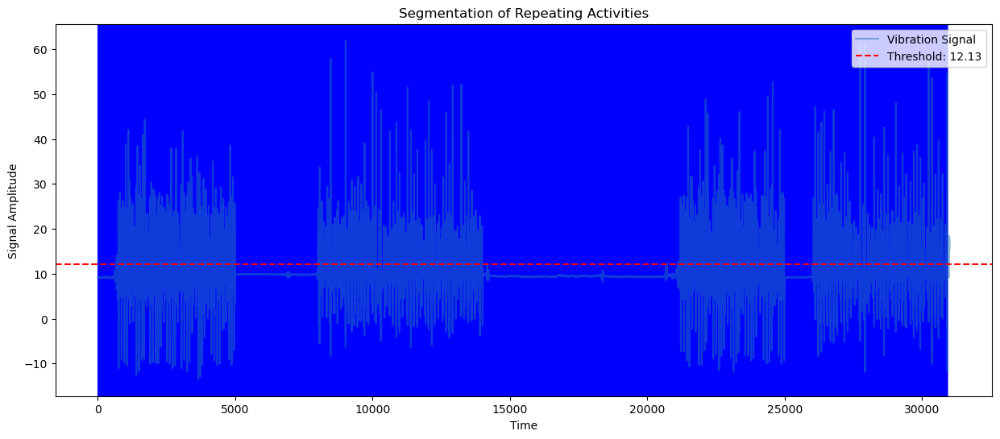

In [57]:
import numpy as np
import matplotlib.pyplot as plt

def plot_segmentation(mp, threshold):
    # Определение меток активности на основе порога
    activity_labels = ['Unknown' for _ in range(len(mp))]

    for i in range(len(mp)):
        if mp[i] <= threshold:
            activity_labels[i] = 'Repeat Activity'  # Повторяющиеся активности
        else:
            activity_labels[i] = 'Other Activity'  # Другие активности
            
    # Визуализация
    plt.figure(figsize=(15, 6))
    plt.plot(ts, label='Vibration Signal', alpha=0.5)
    
    # Обозначение повторяющихся активности
    for i in range(len(activity_labels)):
        if activity_labels[i] == 'Repeat Activity':
            plt.axvspan(i, i + 1, color='blue', alpha=0.3)

    plt.axhline(y=threshold, color='red', linestyle='--', label=f'Threshold: {threshold:.2f}')
    
    plt.title('Segmentation of Repeating Activities')
    plt.xlabel('Time')
    plt.ylabel('Signal Amplitude')
    plt.legend()
    plt.show()

# Используем функцию для визуализации результатов сегментации
plot_segmentation(mp['mp'], threshold)


Загрузите истинную разметку временного ряда PAMAP *pamap_labels.csv*, где 0 означает ходьбу, 1 – подъем по лестнице, 2 – спуск с лестницы. Вычислите точность по метрике accuracy, сравнив полученные результаты по основе матричного профиля с истинной разметкой.

In [ ]:
labels_url = './datasets/part2/pamap_labels.csv'

labels = pd.read_csv(labels_url, header=None).squeeze().to_numpy()

C:\Users\Hotaru\anaconda3\envs\keras_env\lib\site-packages\numpy\core\_methods.py:173: RuntimeWarning:

invalid value encountered in subtract



Calculated threshold: nan
Accuracy: 35.60%


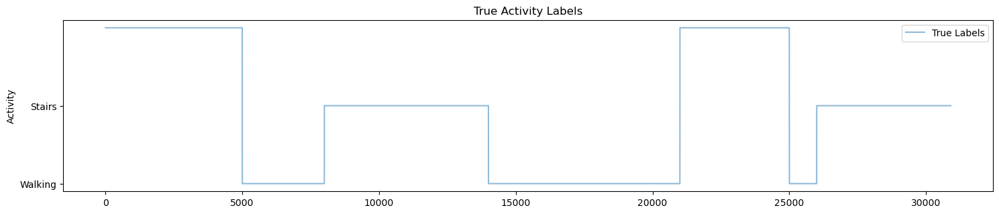

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import stumpy

# Загрузка данных временного ряда
ts_url = './datasets/part2/pamap.csv'
ts = pd.read_csv(ts_url, header=None).squeeze().to_numpy()

# Загрузка истинной разметки
labels_url = './datasets/part2/pamap_labels.csv'
labels = pd.read_csv(labels_url, header=None).squeeze().to_numpy()

# Параметры
m = 100  # Размер окна
k = 2    # Коэффициент для порога

# Вычисление матричного профиля
mp = {}
mp['mp'] = stumpy.stump(ts, m=m)[:, 0]  # Только матричный профиль

# Вычисление порога
mean_mp = np.mean(mp['mp'])
std_mp = np.std(mp['mp'])
threshold = mean_mp + k * std_mp
print(f"Calculated threshold: {threshold}")

# Определим метки активности на основе порога
predicted_labels = []
for value in mp['mp']:
    if value <= threshold:
        predicted_labels.append(1)  # Подъем или спуск по лестнице (объединим в одну категорию)
    else:
        predicted_labels.append(0)  # Ходьба

# Преобразуем в массив
predicted_labels = np.array(predicted_labels)

# Сравнение и расчет точности
# Убедитесь, что длины массивов совпадают
min_length = min(len(labels), len(predicted_labels))
accuracy = np.sum(labels[:min_length] == predicted_labels[:min_length]) / min_length
print(f"Accuracy: {accuracy * 100:.2f}%")

# Дополнительно: визуализация предсказанных меток
plt.figure(figsize=(15, 6))
plt.subplot(2, 1, 1)
plt.plot(labels[:min_length], label='True Labels', alpha=0.5)
plt.title('True Activity Labels')
plt.ylabel('Activity')
plt.yticks([0, 1], ['Walking', 'Stairs'])
plt.legend()


plt.tight_layout()
plt.show()


## **Чaсть 3.** Casy Study: Раскрытие краж электричества подменой счетчиков (meter-swapping detection).


### **Задача 5.**

Рассмотрим практическое применение использования матричного профиля для решения задачи, связанной с раскрытием краж электричества путем подмены счетчиков.

Загрузите временные ряды из директории *./datasets/part3/*, которые были выбраны случайным образом из набора данных (House 1, 2, 3, 4 и 11), содержащего данные потребления электроэнергии 20 жилых домов в Великобритании с 1 января по 23 декабря 2014 года.

In [ ]:
path = './datasets/part3/'

house_idx = [1, 2, 3, 4, 11]

filenames = [f"House{i}.csv" for i in house_idx]

consumptions = {}
for house in filenames:
    consumptions[house[:-4]] = pd.read_csv(os.path.join(path, house), header=None, index_col=0)
    consumptions[house[:-4]].index = pd.to_datetime(consumptions[house[:-4]].index, dayfirst=True)

Далее смоделируем событие замены счетчика. Для этого каждый временной ряд разделим на две части: "Head" (до 1 октября) и "Tail" (после 1 октября). После чего выберем случайным образом 2 временных ряда (например, House1 и House11) и поменяем местами их "Tail" части.

In [ ]:
cutoff = pd.to_datetime('2014-10-01')
heads, tails = heads_tails(consumptions, cutoff, house_idx)

#swap Heads and Tails of 1 and 11
swap1, swap2 = 1, 11
consumptions[f'House{swap1}'] = heads[f'H_{swap1}'].append(tails[f'T_{swap2}'])
consumptions[f'House{swap2}'] = heads[f'H_{swap2}'].append(tails[f'T_{swap1}'])
heads, tails = heads_tails(consumptions, cutoff, house_idx)

Визуализируйте исходные временные ряды и параллельную оси OY прямую, которая делит временные ряды на "Head" и "Tail" части.

In [ ]:
plot_consumptions_ts(consumptions, cutoff, house_idx)

Чтобы найти переставленную пару временных рядов, выполним следующее. Сначала составим временные ряды $H_i$ из всевозможных комбинаций "Head" и "Tail" частей исходных временных рядов $T_K$, где $1 \leq i \leq |T|^2$, $1 \leq K \leq |T|$. В нашем случае, $|T| = 5$.  Далее среди них найдем такую пару временных рядов $(H_i, H_j)$, которая имеет минимальную оценку $swap\_score$. Минимальная оценка $swap\_score$ для пары рядов $(H_i, H_j)$ вычисляется следующим образом:

\begin{equation}
swap\_score(i,j) = \frac{\min{(Head_{H_i} \bowtie Tail_{H_j})}}{\min{(Head_{H_i} \bowtie Tail_{H_i})}+eps},
\end{equation}

где $\bowtie$ – операция нахождения матричного профиля между двумя временными рядами. Матричный профиль между двумя временными рядами содержит расстояния между всеми подпоследовательностями первого временного ряда и их ближайшими соседями, которые являются подпоследовательностями второго временного ряда.

Добавьте в функцию `compute_mp()` в модуле *mp.py* поддежку вычисления матричного профиля между двумя различными временными рядами и найдите пару временных рядов $(H_i, H_j)$, которая имеет минимальную оценку $swap\_score$ среди всех пар.

In [ ]:
m = 24 * 4

min_score = meter_swapping_detection(heads, tails, house_idx, m)

In [ ]:
min_i, min_j, mp_j = min_score['i'], min_score['j'], min_score['mp_j']
print(f'Time series with minimum score is (H_{min_i}, T_{min_j}).')

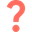
Проанализируйте и изложите содержательный смысл полученных результатов.

*# WRITE YOUR ANSWER*